In [1]:

import numpy as np
import datetime as dt
from datetime import date
from datetime import datetime
from matplotlib import pyplot as plt
import cmocean
from HYJfunction import *
import math

from netCDF4 import Dataset
import pandas as pd
from dateutil.relativedelta import relativedelta
import matplotlib.colors
import os
import cartopy
from cartopy import crs as ccrs
import matplotlib.ticker as mticker
import matplotlib.ticker as ticker
from scipy import ndimage
from multiprocessing import Pool, Manager
import cartopy.feature as cfeature
from scipy.ndimage import convolve
from scipy.signal import detrend
import pickle
import xarray as xr
import regionmask
from matplotlib.patches import Polygon
import matplotlib.path as mpath
from matplotlib.lines import Line2D
from multiprocessing import Pool, Manager
from matplotlib.colors import BoundaryNorm, ListedColormap
import seaborn as sns
import imageio
from scipy import stats
from collections import defaultdict
import dask

# %% dataset settings -------------------------------------------------------------
datasets = ["ERA5", "MERRA2", "JRA3Q"]

OUT_DIR_List = {
    "ERA5": "/scratch/bell/hu1029/LGHW/interm_ERA5",
    "MERRA2": "/scratch/bell/hu1029/LGHW/interm_MERRA2",
    "JRA3Q": "/scratch/bell/hu1029/LGHW/interm_JRA3Q"
}
yearnameList = {
    "ERA5": "1979_2025",
    "MERRA2": "1980_2025",
    "JRA3Q": "1979_2025"
}
timerefFile = {
    "ERA5": "/scratch/bell/hu1029/Data/processed/ERA5_Z500_6hr_1979_2025_1dg.nc",
    "MERRA2": "/scratch/bell/hu1029/Data/processed/MERRA2_Z500_6hr_1980_2025_1dg.nc",
    "JRA3Q": "/scratch/bell/hu1029/Data/processed/JRA3Q_Z500_6hr_1979_2025_1dg.nc"
}
latrefFile = {
    "ERA5": "/scratch/bell/hu1029/LGHW/interm_ERA5/ERA5_LWA_lat_1979_2025_6hr.npy",
    "MERRA2": "/scratch/bell/hu1029/LGHW/interm_MERRA2/MERRA2_LWA_lat_1980_2025_6hr.npy",
    "JRA3Q": "/scratch/bell/hu1029/LGHW/interm_JRA3Q/JRA3Q_LWA_lat_1979_2025_6hr.npy"
}
lonrefFile = {
    "ERA5": "/scratch/bell/hu1029/LGHW/interm_ERA5/ERA5_LWA_lon_1979_2025_6hr.npy",
    "MERRA2": "/scratch/bell/hu1029/LGHW/interm_MERRA2/MERRA2_LWA_lon_1980_2025_6hr.npy",
    "JRA3Q": "/scratch/bell/hu1029/LGHW/interm_JRA3Q/JRA3Q_LWA_lon_1979_2025_6hr.npy"
}
varnameList = {
    "ERA5": "z",
    "MERRA2": "H",
    "JRA3Q": "hgt-pres-an-ll125"
}

# %% 00 prepare the environment and functions
regions = ["ATL", "NP", "SP"]
seasons = ["ALL"] # ["ALL", "DJF", "JJA"]
seasonsmonths = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12] #[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12], [12, 1, 2], [6, 7, 8]]
blkTypes = ["Ridge", "Trough", "Dipole"]


In [2]:

# for dtname in datasets:
    
#     print(f"Processing dataset: {dtname}", flush=True)
#     OUTDIR = OUT_DIR_List[dtname]
#     INDIR = OUTDIR
#     yearname = yearnameList[dtname]
#     latfile = latrefFile[dtname]
#     lonfile = lonrefFile[dtname]
#     timefile = timerefFile[dtname]
#     varn = varnameList[dtname]
    
#     # attributes for tracks
#     lat = np.load(latfile)
#     lon = np.load(lonfile)
#     print(lat, flush=True)

#     ### Time Management ###
#     start_year, end_year = map(int, yearname.split('_'))
#     Datestamp = pd.date_range(start=f"{start_year}-01-01", end=f"{end_year}-12-31")
#     datetime_array = pd.DataFrame({'date': pd.to_datetime(Datestamp)})
#     timei = list(datetime_array['date'])

#     ss = "ALL"

#     timestep = np.arange(-32, 33, 8)
#     print(timestep, flush=True)

#     titles = ["Ridge", "Trough", "Dipole"]
#     regions = ["ATL", "NP", "SP"]

#     nrows = len(timestep)
#     n_regions = len(regions)
#     n_types = 3
#     ncols = n_regions * n_types

#     fig, axes = plt.subplots(
#         nrows=nrows,
#         ncols=ncols,
#         figsize=(ncols * 3.2, nrows * 3),
#         squeeze=False
#     )

#     latarr = np.arange(0 - 40, 0 + 40)
#     lonarr = np.arange(0 - 80, 0 + 40)

#     for r, rgname in enumerate(regions):

#         for j in range(n_types):

#             typeid = j + 1

#             centeredZ500npy = np.load(
#                 f"{OUTDIR}/{dtname}_CenteredZ500_timewindow65_BlkType_Type{typeid}_{rgname}_{ss}.npy"
#             )
#             centeredACnpy = np.load(
#                 f"{OUTDIR}/{dtname}_CenteredAC_timewindow65_BlkType_Type{typeid}_{rgname}_{ss}.npy"
#             )
#             centeredCCnpy = np.load(
#                 f"{OUTDIR}/{dtname}_CenteredCC_timewindow65_BlkType_Type{typeid}_{rgname}_{ss}.npy"
#             )

#             centeredZ500_mean = np.nanmean(centeredZ500npy, axis=0)

#             col = r * n_types + j

#             for i, tid in enumerate(timestep):

#                 ti = tid + 32

#                 centeredZ500npyti = centeredZ500_mean[ti, :, :]

#                 _, AC_lat_idx, AC_lon_idx = np.where(centeredACnpy[:, ti, :, :] >= 1)
#                 _, CC_lat_idx, CC_lon_idx = np.where(centeredCCnpy[:, ti, :, :] >= 1)

#                 ax = axes[i, col]

#                 cs = ax.contour(
#                     lonarr,
#                     latarr,
#                     centeredZ500npyti,
#                     levels=10,
#                     colors="k",
#                     linewidths=1.3
#                 )

#                 ax.scatter(
#                     lonarr[AC_lon_idx],
#                     latarr[AC_lat_idx],
#                     c="#0044FF",
#                     marker="o",
#                     s=70,
#                     edgecolors="none",
#                     alpha=0.35
#                 )

#                 ax.scatter(
#                     lonarr[CC_lon_idx],
#                     latarr[CC_lat_idx],
#                     c="#FF4800",
#                     marker="o",
#                     s=70,
#                     edgecolors="none",
#                     alpha=0.35
#                 )

#                 ax.clabel(cs, inline=True, fontsize=8)

#                 if col == 0:
#                     ax.set_ylabel(f"Day {tid/4:.0f}", fontsize=12)

#                 if i == 0:
#                     ax.set_title(f"{rgname}\n{titles[j]}", fontsize=13)

#                 ax.tick_params(labelsize=8)

#     plt.tight_layout()
#     plt.subplots_adjust(hspace=0.3, wspace=0.2)

#     # plt.savefig(
#     #     f"./FINAL_figures/Nature_ExtendedFig2_{dtname}.png",
#     #     dpi=400,
#     #     bbox_inches="tight"
#     # )

#     plt.show()
#     plt.close()

#     print("done with all regions, season:", ss, flush=True)

In [3]:
# =========================
# STEP 1: precompute
# =========================
precomputed = {}

ss = "ALL"
regions = ["ATL", "NP", "SP"]
titles = ["Ridge", "Trough", "Dipole"]
n_types = 3

for dtname in datasets:

    print(f"Precomputing dataset: {dtname}", flush=True)

    OUTDIR = OUT_DIR_List[dtname]

    precomputed[dtname] = {}

    for rgname in regions:

        precomputed[dtname][rgname] = {}

        for j in range(n_types):

            typeid = j + 1

            print(f"  loading {rgname} type {typeid}", flush=True)

            centeredZ500npy = np.load(
                f"{OUTDIR}/{dtname}_CenteredZ500_timewindow65_BlkType_Type{typeid}_{rgname}_{ss}.npy"
            )
            centeredACnpy = np.load(
                f"{OUTDIR}/{dtname}_CenteredAC_timewindow65_BlkType_Type{typeid}_{rgname}_{ss}.npy"
            )
            centeredCCnpy = np.load(
                f"{OUTDIR}/{dtname}_CenteredCC_timewindow65_BlkType_Type{typeid}_{rgname}_{ss}.npy"
            )

            # mean
            centeredZ500_mean = np.nanmean(centeredZ500npy, axis=0)

            precomputed[dtname][rgname][typeid] = {
                "Z500_mean": centeredZ500_mean,
                "AC": centeredACnpy,
                "CC": centeredCCnpy
            }

print("Precompute done.")

Precomputing dataset: ERA5
  loading ATL type 1
  loading ATL type 2
  loading ATL type 3
  loading NP type 1
  loading NP type 2
  loading NP type 3
  loading SP type 1
  loading SP type 2
  loading SP type 3
Precomputing dataset: MERRA2
  loading ATL type 1
  loading ATL type 2
  loading ATL type 3
  loading NP type 1
  loading NP type 2
  loading NP type 3
  loading SP type 1
  loading SP type 2
  loading SP type 3
Precomputing dataset: JRA3Q
  loading ATL type 1
  loading ATL type 2
  loading ATL type 3
  loading NP type 1
  loading NP type 2
  loading NP type 3
  loading SP type 1
  loading SP type 2
  loading SP type 3
Precompute done.


Plotting dataset: ERA5


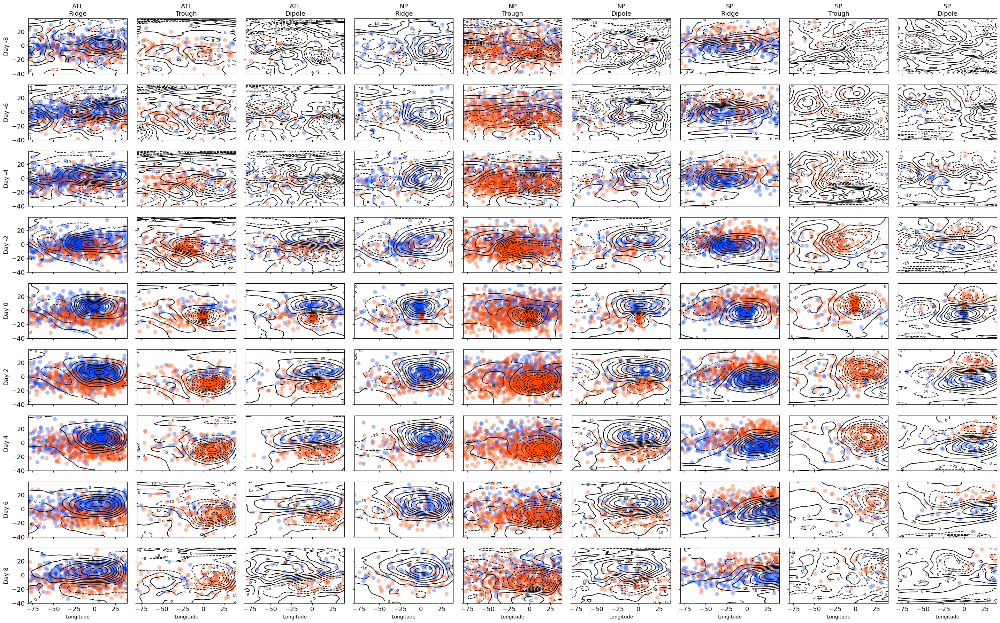

done: ERA5
Plotting dataset: MERRA2


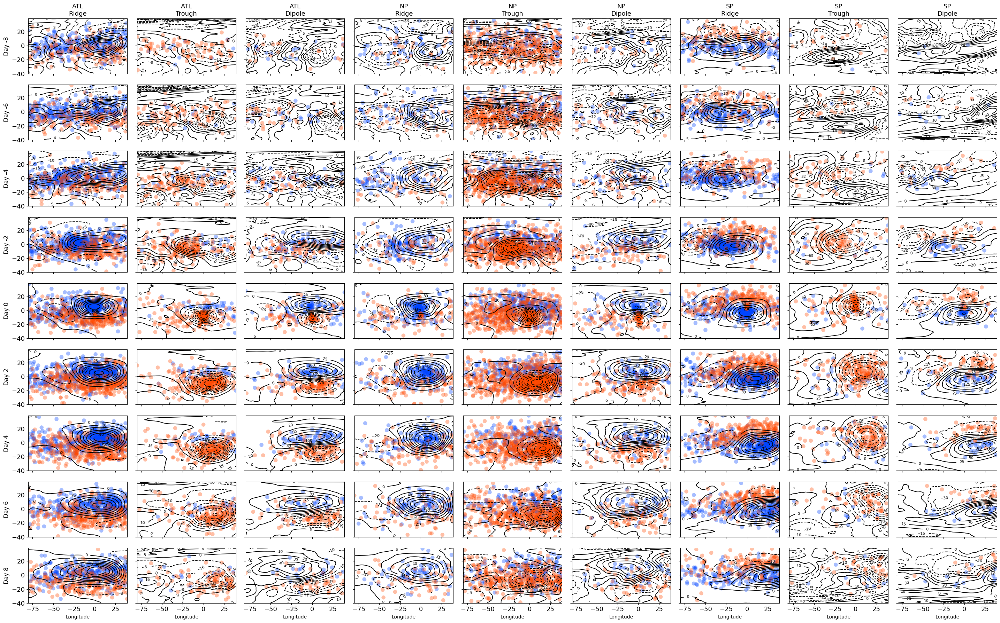

done: MERRA2
Plotting dataset: JRA3Q


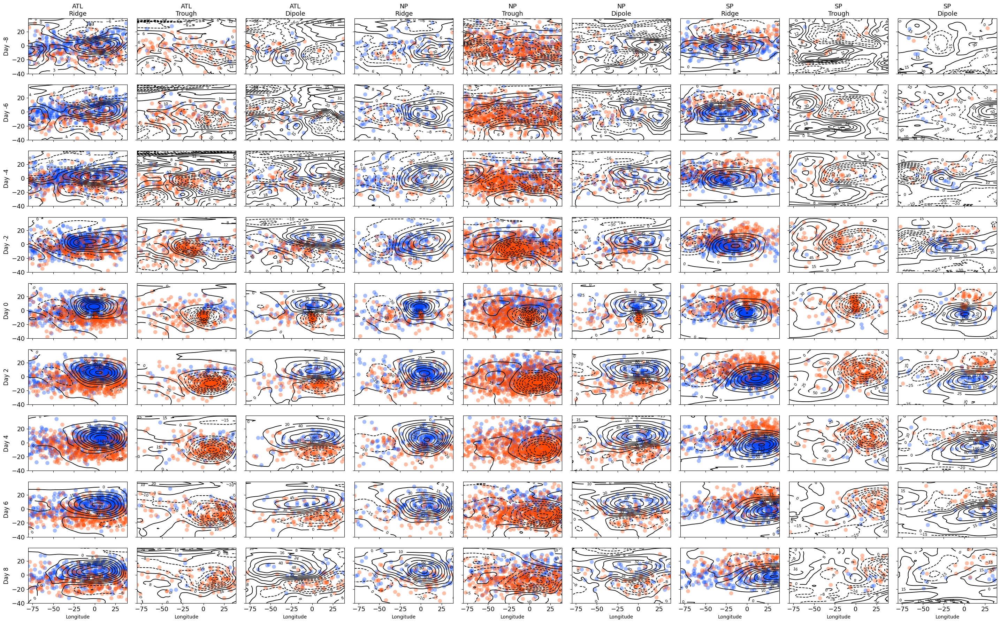

done: JRA3Q


In [11]:
# =========================
# STEP 2: plot (original)
# =========================
timestep = np.arange(-32, 33, 8)

latarr = np.arange(0 - 40, 0 + 40)
lonarr = np.arange(0 - 80, 0 + 40)

for dtname in datasets:

    print(f"Plotting dataset: {dtname}", flush=True)

    nrows = len(timestep)
    ncols = len(regions) * n_types

    fig, axes = plt.subplots(
        nrows=nrows,
        ncols=ncols,
        figsize=(ncols * 3.2, nrows * 2),
        squeeze=False
    )

    for r, rgname in enumerate(regions):

        for j in range(n_types):

            typeid = j + 1
            col = r * n_types + j

            data = precomputed[dtname][rgname][typeid]

            centeredZ500_mean = data["Z500_mean"]
            centeredACnpy = data["AC"]
            centeredCCnpy = data["CC"]

            for i, tid in enumerate(timestep):

                ti = tid + 32

                centeredZ500npyti = centeredZ500_mean[ti, :, :]

                _, AC_lat_idx, AC_lon_idx = np.where(centeredACnpy[:, ti, :, :] >= 1)
                _, CC_lat_idx, CC_lon_idx = np.where(centeredCCnpy[:, ti, :, :] >= 1)

                ax = axes[i, col]

                cs = ax.contour(
                    lonarr,
                    latarr,
                    centeredZ500npyti,
                    levels=10,
                    colors="k",
                    linewidths=1.3
                )

                ax.scatter(
                    lonarr[AC_lon_idx],
                    latarr[AC_lat_idx],
                    c="#0044FF",
                    marker="o",
                    s=70,
                    edgecolors="none",
                    alpha=0.35
                )

                ax.scatter(
                    lonarr[CC_lon_idx],
                    latarr[CC_lat_idx],
                    c="#FF4800",
                    marker="o",
                    s=70,
                    edgecolors="none",
                    alpha=0.35
                )

                ax.clabel(cs, inline=True, fontsize=8)

                if col == 0:
                    ax.set_ylabel(f"Day {tid/4:.0f}", fontsize=12)
                    ax.tick_params(axis="y", labelleft=True)
                else:
                    ax.set_ylabel("")
                    ax.tick_params(axis="y", labelleft=False)

                if i == nrows - 1:
                    ax.set_xlabel("Longitude", fontsize=10)
                    ax.tick_params(axis="x", labelbottom=True)
                else:
                    ax.set_xlabel("")
                    ax.tick_params(axis="x", labelbottom=False)

                if i == 0:
                    ax.set_title(f"{rgname}\n{titles[j]}", fontsize=13)

                ax.tick_params(labelsize=13)

    plt.tight_layout()
    plt.subplots_adjust(hspace=0.2, wspace=0.1)

    plt.savefig('./FINAL_figures/Nature_ExtendedFig2_{}.png'.format(dtname), dpi=400, bbox_inches="tight")
    plt.show()
    plt.close()

    print("done:", dtname, flush=True)
    